In [25]:
import os
import glob
import random
import datetime

import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

from pathlib import Path

from tensorflow import keras
from tensorflow.keras.utils import Sequence
from tensorflow.keras.callbacks import Callback

from skimage.io import imread
from skimage.transform import resize

In [26]:
class DataLoader(Sequence):
    
    def __init__(self, im_dir, labels= None, batch_size= 32, resize= False, output_dim= None, classification= True, shuffle= True):
        
        self.im_dir = im_dir
        self.classification = classification
        self.shuffle = shuffle
        self.resize = resize
        self.output_dim = output_dim

        self.labels = {}
        if isinstance(labels, list):
            for i, label in enumerate(labels):
                self.labels[label] = i
        elif isinstance(labels, dict):
            self.labels = labels
        else:
            for root_dir, subdirs, files in os.walk(self.im_dir):
                for i, subdir in enumerate(subdirs):
                    self.labels[subdir] = i
        
            
        self.images = glob.glob(f"{self.im_dir}/*/*")[:30_000]
        random.shuffle(self.images)
        
        if batch_size >= len(self.images):
            self.batch_size = len(self.images)
        else:
            self.batch_size = batch_size 
        self.on_epoch_end()
        
    
    def __len__(self):
        return int(np.floor(len(self.images)/self.batch_size))
    
    def __getitem__(self, index):
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        im_files_batch = [self.images[idx] for idx in indexes]
        if self.resize:
            batch_images = np.array([resize(imread(file), self.output_dim, preserve_range= True) for file in im_files_batch], dtype= np.uint8)
            batch_images = (np.asanyarray(batch_images, dtype= np.float32)-127.5)/127.5
        else:
            batch_images = np.arrary([imread(file) for file in im_files_batch], dtype= np.uint8)
        
        batch_labels = np.empty((self.batch_size), dtype= np.int8)
        for i, im in enumerate(im_files_batch):
            for label in self.labels.keys():
                if label in im:
                    batch_labels[i] = self.labels[label]
        return batch_images, batch_labels
    
    def on_epoch_end(self):
        "Updates all indexes after the end of each epoch"
        self.indexes = np.arange(len(self.images))
        if self.shuffle:
            np.random.shuffle(self.indexes)
            
        
    def add_data(self, batched_data):
        return

In [27]:
class SaveImagesCallback(Callback):
    def __init__(self, logdir):
        self.logdir = Path(f"{logdir}/{datetime.datetime.now().strftime('%Y-%m-%d_%H-%M-%S')}")
        
        self.logdir.mkdir(exist_ok=True, parents=True)
        self.fixed_noise = tf.random.normal([batch_size, 1, 1, 128])
        
    def on_epoch_end(self, epoch, logs= None):
        if epoch % 100 == 0:
            generator = self.model.generator
            predictions = generator(self.fixed_noise, training=False)
            pred_16_index = np.random.choice(np.array(list(range(predictions.shape[0]))), size= 16)
            predictions = np.array([predictions[x, :, :, :] for x in pred_16_index])

            fig = plt.figure(figsize=(8, 8))
            for i in range(predictions.shape[0]):
                plt.subplot(4, 4, i+1)
                plt.imshow(np.asarray(predictions[i, :, :, :] * 127.5 + 127.5, dtype= np.uint8))
                plt.axis('off')

            plt.savefig(f'{str(self.logdir)}/tf_image_at_epoch_{epoch:04d}.png')
            plt.show()

In [50]:
discriminator = keras.Sequential(
    [
        keras.Input(shape=(128, 128, 3)),
        layers.Conv2D(64, (4, 4), strides=(2, 2), padding="same", use_bias= False),
        layers.LeakyReLU(alpha=0.2),

        layers.Conv2D(64*2, (4, 4), strides=(2, 2), padding="same", use_bias= False),
        layers.BatchNormalization(),
        layers.LeakyReLU(alpha=0.2),
        
        
        layers.Conv2D(64*4, (4, 4), strides= (2, 2), padding= "same", use_bias= False),
        layers.BatchNormalization(),
        layers.LeakyReLU(alpha= 0.2),

        layers.Conv2D(64*8, (4, 4), strides= (2, 2), padding= "same", use_bias= False),
        layers.BatchNormalization(),
        layers.LeakyReLU(alpha= 0.2),

        layers.Conv2D(64*8, (4, 4), strides=(2, 2), padding="same", use_bias= False),
        layers.LeakyReLU(alpha=0.2),
        layers.BatchNormalization(),    
        
        layers.Conv2D(64*4, (4, 4), strides=(2, 2), padding="same", use_bias= False),
        layers.LeakyReLU(alpha=0.2),
        layers.BatchNormalization(),

        layers.Conv2D(64*2, (4, 4), strides=(2, 2), padding="same", use_bias= False),
        layers.LeakyReLU(alpha=0.2),
        layers.BatchNormalization(),
        
        layers.Conv2D(64, (4, 4), strides=(2, 2), padding="same", use_bias= False),
        layers.LeakyReLU(alpha=0.2),
        layers.BatchNormalization(),
        
        layers.Conv2D(1, (3, 3), strides=(4, 4), padding="same", use_bias= False, activation= 'sigmoid'),
    ],
    name="discriminator",
)

# Create the generator
latent_dim = 512
generator = keras.Sequential(
    [
        keras.Input(shape=(1, 1, latent_dim)),
        layers.Conv2DTranspose(64*12, (4, 4), strides=(1, 1), padding="valid", use_bias= False),
        layers.BatchNormalization(),
        layers.ReLU(),
        
        layers.Conv2DTranspose(64*8, (4, 4), strides=(2, 2), padding="same", use_bias= False),
        layers.BatchNormalization(),
        layers.ReLU(),

        layers.Conv2DTranspose(64*8, (4, 4), strides=(2, 2), padding="same", use_bias= False),
        layers.BatchNormalization(),
        layers.ReLU(),
        
        layers.Conv2DTranspose(64*4, (4, 4), strides=(2, 2), padding="same", use_bias= False),
        layers.BatchNormalization(),
        layers.ReLU(),

        layers.Conv2DTranspose(64*4, (4, 4), strides=(2, 2), padding="same", use_bias= False),
        layers.BatchNormalization(),
        layers.ReLU(),

        layers.Conv2DTranspose(64*2, (4, 4), strides=(2, 2), padding="same", use_bias= False),
        layers.BatchNormalization(),
        layers.ReLU(),
        
        layers.Conv2D(3, (3, 3), strides=(1, 1), padding="same", use_bias= False, activation= "tanh"),
    ],
    name="generator",
)


In [51]:
input_vect = tf.random.normal(shape= (32, 1, 1, 512))
output_gen = generator(input_vect)
print(output_gen.shape)
output_disc = discriminator(batch_data)
output_disc.shape

(32, 128, 128, 3)


TensorShape([16, 1, 1, 1])

In [40]:
batch_data.shape

(16, 128, 128, 3)

In [45]:
model = keras.Sequential([        
    keras.Input(shape=(128, 128, 3)),
    layers.Flatten(),
    layers.Dense(128, activation= "relu"),
    layers.Dense(1, activation= "sigmoid")
])

In [46]:
output = model(batch_data)
output.shape

TensorShape([16, 1])

## Default TF Struct - Size 28

In [16]:
from tensorflow.keras import layers

# Create the discriminator
discriminator = keras.Sequential(
    [
        keras.Input(shape=(28, 28, 3)),
        layers.Conv2D(64, (3, 3), strides=(2, 2), padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.BatchNormalization(),
        layers.Conv2D(128, (3, 3), strides=(2, 2), padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.BatchNormalization(),
        layers.Conv2D(256, (3, 3), strides= (2, 2), padding= "same"),
        layers.LeakyReLU(alpha= 0.2),
        layers.BatchNormalization(),
        layers.Conv2D(256, (3, 3), strides=(2, 2), padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.BatchNormalization(),        
        layers.GlobalMaxPooling2D(),
        layers.Dense(1),
    ],
    name="discriminator",
)

# Create the generator
latent_dim = 128
generator = keras.Sequential(
    [
        keras.Input(shape=(latent_dim,)),
        # We want to generate 128 coefficients to reshape into a 7x7x128 map
        layers.Dense(7 * 7 * 128),
        layers.LeakyReLU(alpha=0.2),
        layers.Reshape((7, 7, 128)),
        layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Conv2D(3, (7, 7), padding="same", activation="tanh"),
    ],
    name="generator",
)

## Default TF Struct - Size 64

In [17]:
from tensorflow.keras import layers

# Create the discriminator
discriminator = keras.Sequential(
    [
        keras.Input(shape=(64, 64, 3)),
        layers.Conv2D(64, (3, 3), strides=(2, 2), padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.BatchNormalization(),
        layers.Conv2D(128, (3, 3), strides=(2, 2), padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.BatchNormalization(),
        layers.Conv2D(256, (3, 3), strides= (2, 2), padding= "same"),
        layers.LeakyReLU(alpha= 0.2),
        layers.BatchNormalization(),
        layers.Conv2D(256, (3, 3), strides=(2, 2), padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.BatchNormalization(),        
        layers.GlobalMaxPooling2D(),
        layers.Dense(1),
    ],
    name="discriminator",
)

# Create the generator
latent_dim = 128
generator = keras.Sequential(
    [
        keras.Input(shape=(latent_dim,)),
        # We want to generate 128 coefficients to reshape into a 7x7x128 map
        layers.Dense(8 * 8 * 128),
        layers.LeakyReLU(alpha=0.2),
        layers.Reshape((8, 8, 128)),
        layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"),
        layers.LeakyReLU(alpha=0.2),
        layers.Conv2D(3, (7, 7), padding="same", activation="tanh"),
    ],
    name="generator",
)

In [18]:
fixed_noise = tf.random.normal(shape= (32, 128))
output = generator(fixed_noise)
output.shape

TensorShape([32, 64, 64, 3])

In [19]:
from tensorflow.keras import layers

# Create the discriminator
discriminator = keras.Sequential(
    [
        keras.Input(shape=(64, 64, 3)),
        layers.Conv2D(64, (4, 4), strides=(2, 2), padding="same", use_bias= False),
        layers.LeakyReLU(alpha=0.2),

        layers.Conv2D(64*2, (4, 4), strides=(2, 2), padding="same", use_bias= False),
        layers.BatchNormalization(),
        layers.LeakyReLU(alpha=0.2),
        
        
        layers.Conv2D(64*4, (4, 4), strides= (2, 2), padding= "same", use_bias= False),
        layers.BatchNormalization(),
        layers.LeakyReLU(alpha= 0.2),
        
        layers.Conv2D(64*8, (4, 4), strides=(2, 2), padding="same", use_bias= False),
        layers.LeakyReLU(alpha=0.2),
        layers.BatchNormalization(),
        
        layers.Conv2D(1, (3, 3), strides=(4, 4), padding="same", use_bias= False, activation= 'sigmoid'),
        
    ],
    name="discriminator",
)

# Create the generator
latent_dim = 128
generator = keras.Sequential(
    [
        keras.Input(shape=(1, 1, latent_dim)),
        layers.Conv2DTranspose(64*8, (4, 4), strides=(1, 1), padding="valid", use_bias= False),
        layers.BatchNormalization(),
        layers.ReLU(),
        
        layers.Conv2DTranspose(64*4, (4, 4), strides=(2, 2), padding="same", use_bias= False),
        layers.BatchNormalization(),
        layers.ReLU(),
        
        layers.Conv2DTranspose(64*4, (4, 4), strides=(2, 2), padding="same", use_bias= False),
        layers.BatchNormalization(),
        layers.ReLU(),

        layers.Conv2DTranspose(64*2, (4, 4), strides=(2, 2), padding="same", use_bias= False),
        layers.BatchNormalization(),
        layers.ReLU(),

        layers.Conv2DTranspose(3, (4, 4), strides=(2, 2), padding="same", activation= "tanh", use_bias= False)
    ],
    name="generator",
)

In [20]:
class GAN(keras.Model):
    def __init__(self, discriminator, generator, latent_dim, batch_size):
        super(GAN, self).__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim
        self.batch_size = batch_size
        
    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super(GAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn
        
    def call(self, data, training=False): 
        # Method needed to be implemented for tensorflow reasons when using a custom data loader
        pass
    
    def train_step(self, real_images):
        if isinstance(real_images, tuple):
            real_images = real_images[0]
        # Sample random points in the latent space
        batch_size = self.batch_size
        #random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))
        random_latent_vectors = tf.random.normal(shape=(batch_size, 1, 1, self.latent_dim))
        
        # Decode them to fake images
        generated_images = self.generator(random_latent_vectors)
        
        # Combine them with real images
        combined_images = tf.concat([generated_images, real_images], axis=0)
        
        # Assemble labels discriminating real from fake images
        labels = tf.concat(
            [tf.ones((batch_size, 1, 1, 1)), tf.zeros((batch_size, 1, 1, 1))], axis=0
        )
        
        # Add random noise to the labels - important trick!
        labels += 0.05 * tf.random.uniform(tf.shape(labels))

        # Train the discriminator
        with tf.GradientTape() as tape:
            predictions = self.discriminator(combined_images)
            d_loss = self.loss_fn(labels, predictions)
        grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(
            zip(grads, self.discriminator.trainable_weights)
        )

        # Sample random points in the latent space
        #random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))
        random_latent_vectors = tf.random.normal(shape=(batch_size, 1, 1, self.latent_dim))

        # Assemble labels that say "all real images"
        misleading_labels = tf.zeros((batch_size, 1, 1, 1))

        # Train the generator (note that we should *not* update the weights
        # of the discriminator)!
        with tf.GradientTape() as tape:
            predictions = self.discriminator(self.generator(random_latent_vectors))
            g_loss = self.loss_fn(misleading_labels, predictions)
        grads = tape.gradient(g_loss, self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_weights))
        return {"d_loss": d_loss, "g_loss": g_loss}

In [21]:
class GAN(keras.Model):
    def __init__(self, discriminator, generator, latent_dim, batch_size):
        super(GAN, self).__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim
        self.batch_size = batch_size
        
    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super(GAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn
    
    def call(self, data, training=False): 
        # Method needed to be implemented for tensorflow reasons when using a custom data loader
        pass
    
    def train_step(self, real_images):
        if isinstance(real_images, tuple):
            real_images = real_images[0]
        # Sample random points in the latent space
        batch_size = self.batch_size
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))
        # Decode them to fake images
        generated_images = self.generator(random_latent_vectors)

        # Combine them with real images
        combined_images = tf.concat([generated_images, real_images], axis=0)
        
        # Assemble labels discriminating real from fake images
        labels = tf.concat(
            [tf.ones((batch_size, 1)), tf.zeros((batch_size, 1))], axis=0
        )
        
        # Add random noise to the labels - important trick!
        labels += 0.05 * tf.random.uniform(tf.shape(labels))

        # Train the discriminator
        with tf.GradientTape() as tape:
            predictions = self.discriminator(combined_images)
            d_loss = self.loss_fn(labels, predictions)
        grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(
            zip(grads, self.discriminator.trainable_weights)
        )

        # Sample random points in the latent space
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

        # Assemble labels that say "all real images"
        misleading_labels = tf.zeros((batch_size, 1))

        # Train the generator (note that we should *not* update the weights
        # of the discriminator)!
        with tf.GradientTape() as tape:
            predictions = self.discriminator(self.generator(random_latent_vectors))
            g_loss = self.loss_fn(misleading_labels, predictions)
        grads = tape.gradient(g_loss, self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_weights))
        return {"d_loss": d_loss, "g_loss": g_loss}

In [36]:
# Prepare the dataset. We use both the training & test MNIST digits.
batch_size = 4
train_cat_dog_data = DataLoader(im_dir= "dataset/Newdata/train_merged", resize= True, output_dim= (128, 128, 3), batch_size= batch_size)
#val_cat_dog_data = DataLoader(im_dir= "dataset/Newdata/Test", resize= True, output_dim= (64, 64, 3), batch_size= batch_size)

In [37]:
len(train_cat_dog_data)

41

In [38]:
iter_data = iter(train_cat_dog_data)
batch_data = next(iter_data)[0]

In [39]:
batch_data_16_index = np.random.choice(np.array(list(range(batch_data.shape[0]))), size= 16)
batch_data = np.array([batch_data[x, :, :, :] for x in batch_data_16_index])
print(batch_data.shape)

(16, 128, 128, 3)


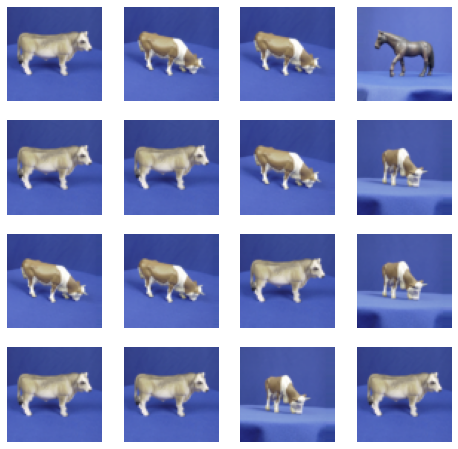

In [9]:
fig = plt.figure(figsize=(8, 8))
for i in range(batch_data.shape[0]):
    plt.subplot(4, 4, i+1)
    plt.imshow(np.asarray(batch_data[i, :, :, :] * 127.5 + 127.5, dtype= np.uint8))
    plt.axis('off')

Epoch 1/30000
41/41 [==============================] - 7s 149ms/step - d_loss: 0.0582 - g_loss: 13.3657


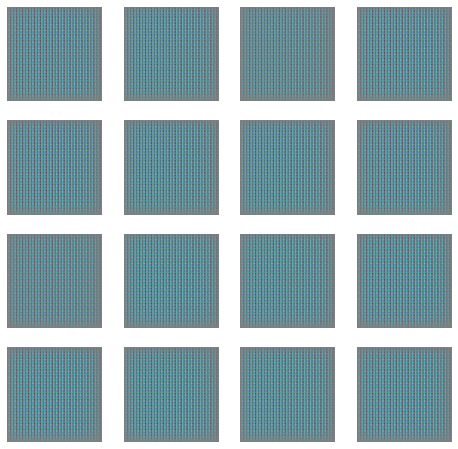

Epoch 2/30000
41/41 [==============================] - 6s 154ms/step - d_loss: -0.4097 - g_loss: 45.9017


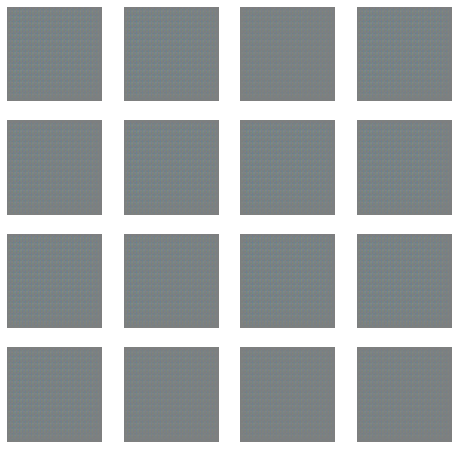

Epoch 3/30000
41/41 [==============================] - 7s 172ms/step - d_loss: -0.0119 - g_loss: 24.0483


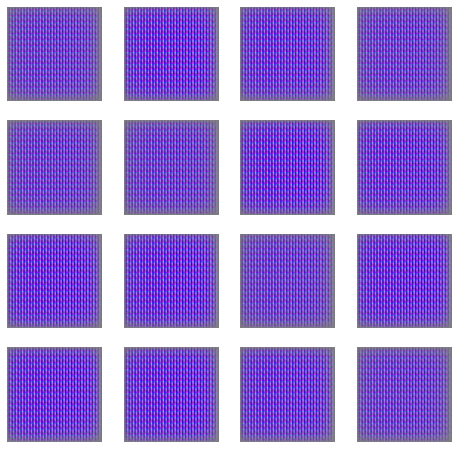

Epoch 4/30000
41/41 [==============================] - 6s 153ms/step - d_loss: -5.6950 - g_loss: 590.6034


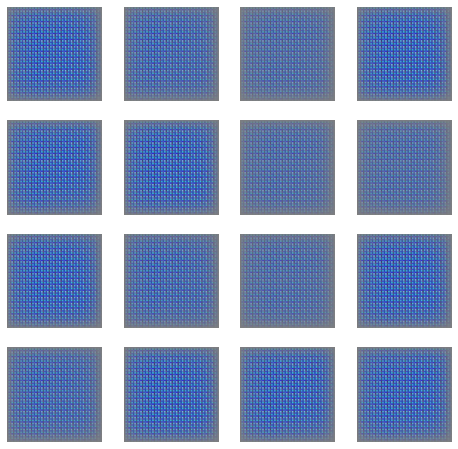

Epoch 5/30000
41/41 [==============================] - 6s 153ms/step - d_loss: 1.9958 - g_loss: 83.1610


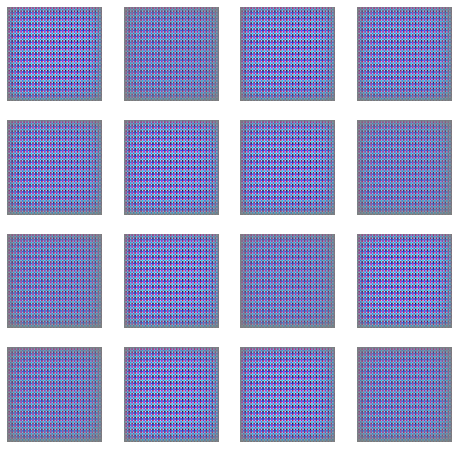

Epoch 6/30000
41/41 [==============================] - 6s 150ms/step - d_loss: -7.0569 - g_loss: 712.6590


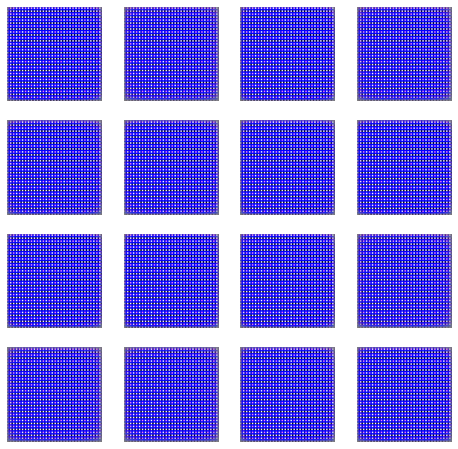

Epoch 7/30000
41/41 [==============================] - 6s 144ms/step - d_loss: -48.1855 - g_loss: 5604.3174


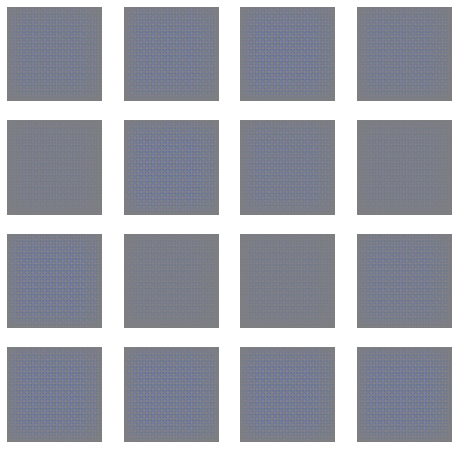

Epoch 8/30000
41/41 [==============================] - 6s 150ms/step - d_loss: 4.6226 - g_loss: 67.8953


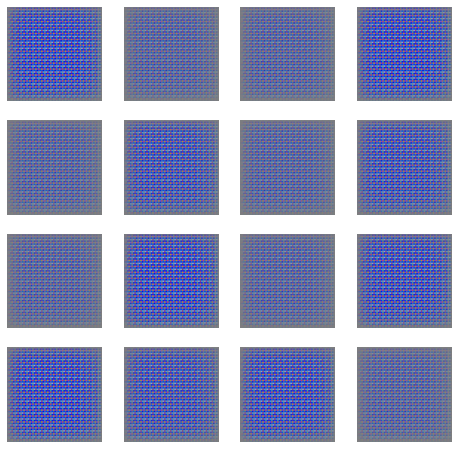

Epoch 9/30000
41/41 [==============================] - 6s 150ms/step - d_loss: 0.1039 - g_loss: 52.6160


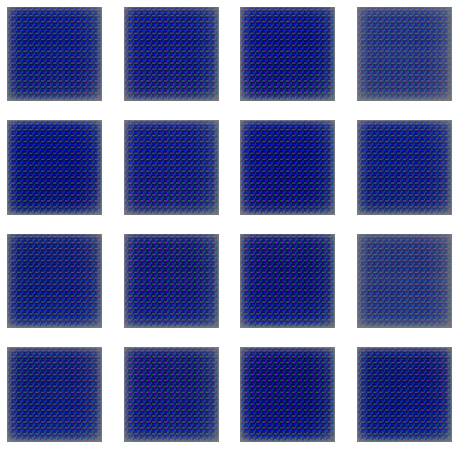

Epoch 10/30000
41/41 [==============================] - 6s 154ms/step - d_loss: -0.0548 - g_loss: 112.0377


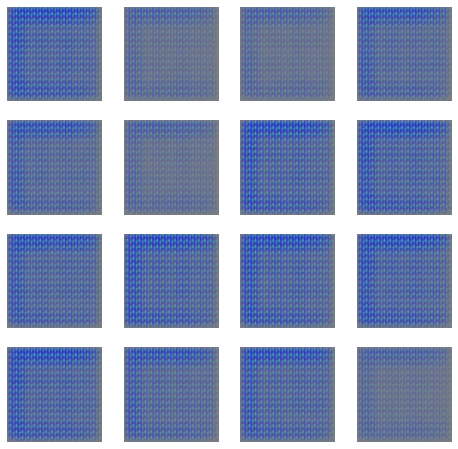

Epoch 11/30000
41/41 [==============================] - 6s 151ms/step - d_loss: 1.4783 - g_loss: 22.8642


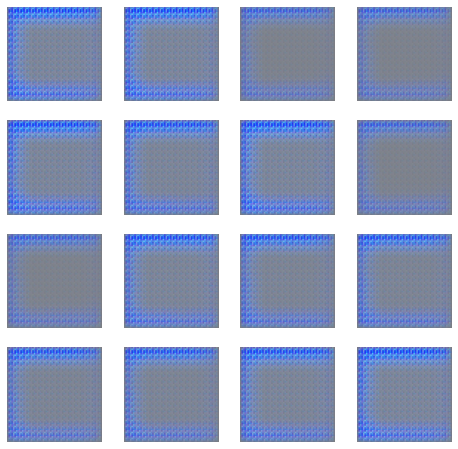

Epoch 12/30000
41/41 [==============================] - 7s 156ms/step - d_loss: 2.6508 - g_loss: 19.7638


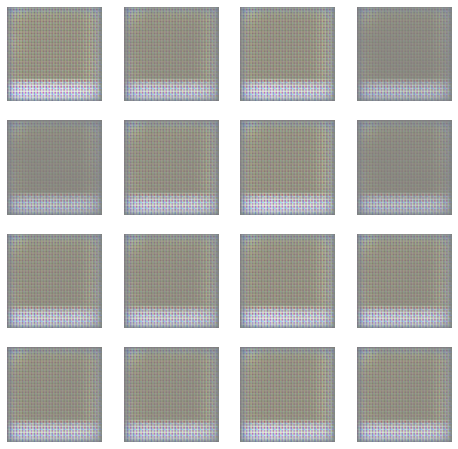

Epoch 13/30000
41/41 [==============================] - 6s 156ms/step - d_loss: 0.7417 - g_loss: 19.4798


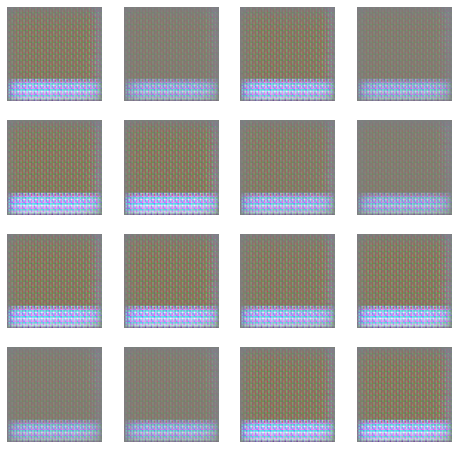

Epoch 14/30000
41/41 [==============================] - 7s 160ms/step - d_loss: 12.3052 - g_loss: 20.1762


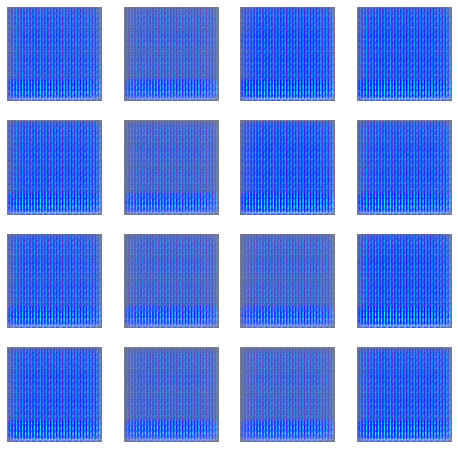

Epoch 15/30000
41/41 [==============================] - 7s 158ms/step - d_loss: 0.4992 - g_loss: 43.5516


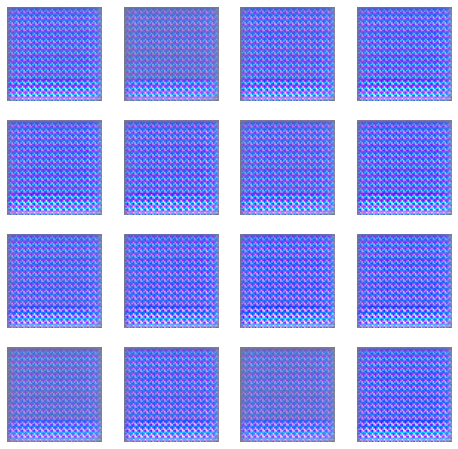

Epoch 16/30000
41/41 [==============================] - 6s 149ms/step - d_loss: 0.3934 - g_loss: 38.6944


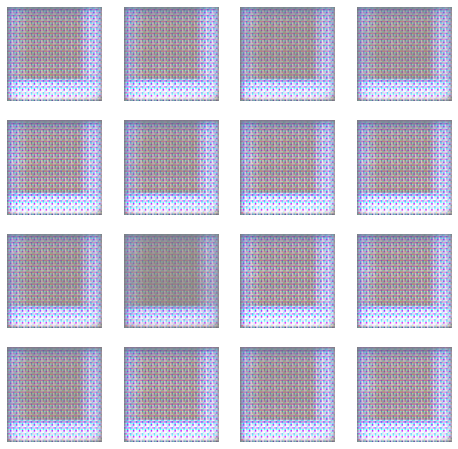

Epoch 17/30000
41/41 [==============================] - 6s 152ms/step - d_loss: 0.5545 - g_loss: 8.8206


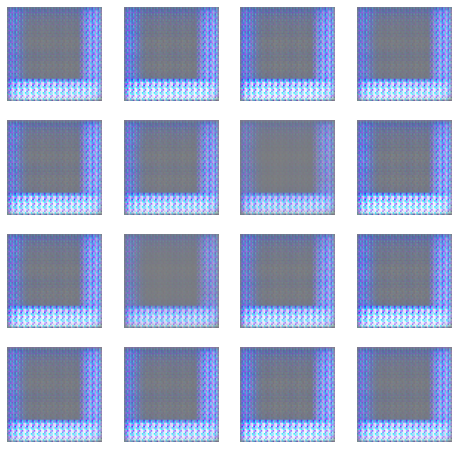

Epoch 18/30000
41/41 [==============================] - 6s 150ms/step - d_loss: 1.7052 - g_loss: 6.6160


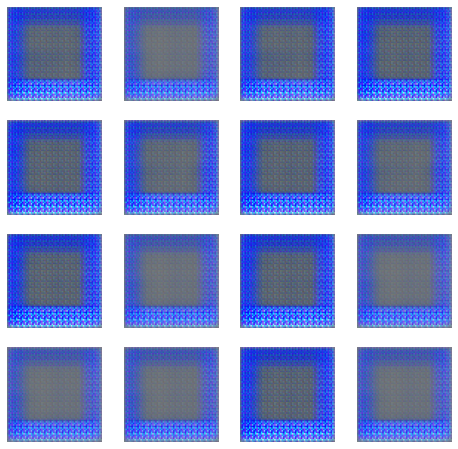

Epoch 19/30000
41/41 [==============================] - 6s 151ms/step - d_loss: 0.2648 - g_loss: 6.9017


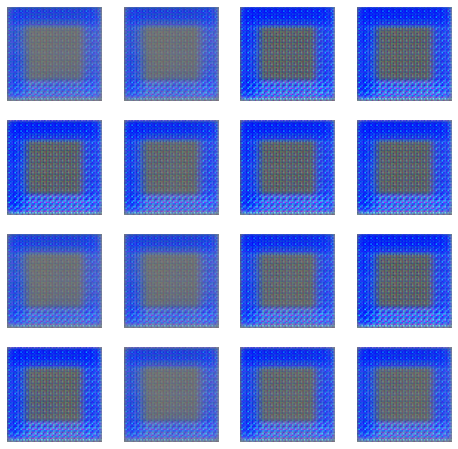

Epoch 20/30000
41/41 [==============================] - 6s 151ms/step - d_loss: 0.2983 - g_loss: 8.7091


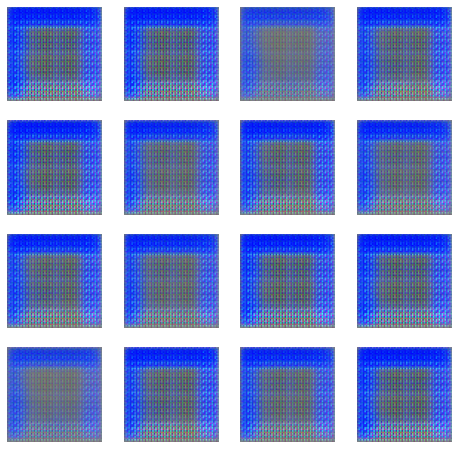

Epoch 21/30000
41/41 [==============================] - 6s 153ms/step - d_loss: 0.1079 - g_loss: 10.3034


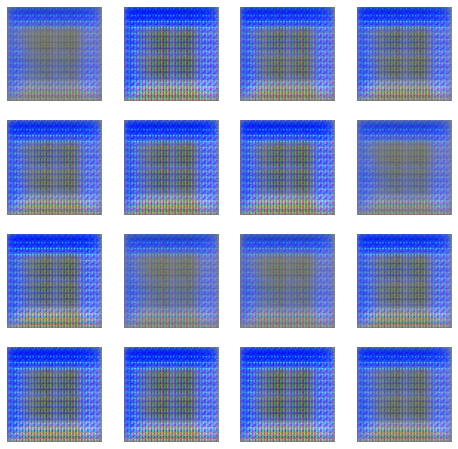

Epoch 22/30000
41/41 [==============================] - 6s 152ms/step - d_loss: 0.1852 - g_loss: 8.3423


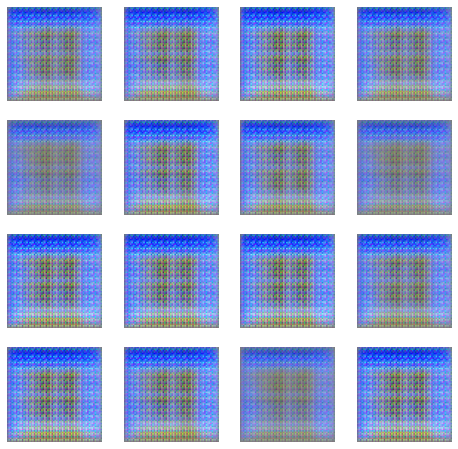

Epoch 23/30000
41/41 [==============================] - 6s 152ms/step - d_loss: 0.3429 - g_loss: 8.4427


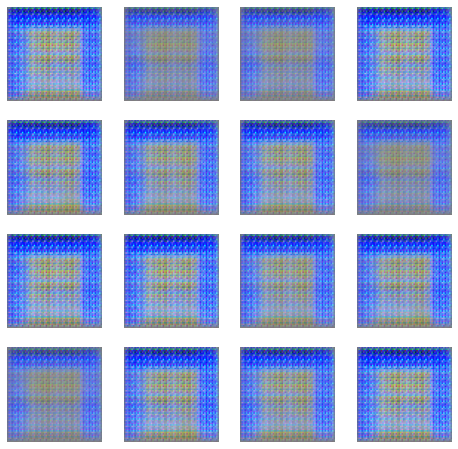

Epoch 24/30000
41/41 [==============================] - 6s 152ms/step - d_loss: 0.3776 - g_loss: 8.8775


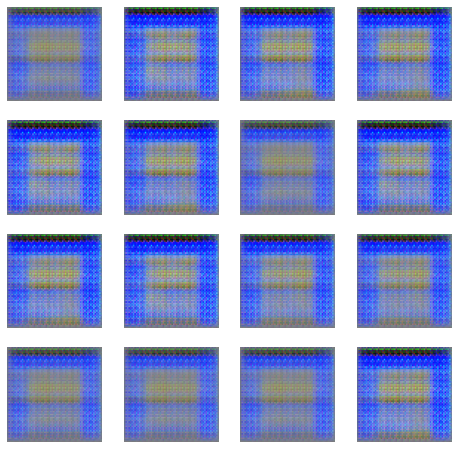

Epoch 25/30000
41/41 [==============================] - 6s 154ms/step - d_loss: 0.3884 - g_loss: 9.8737


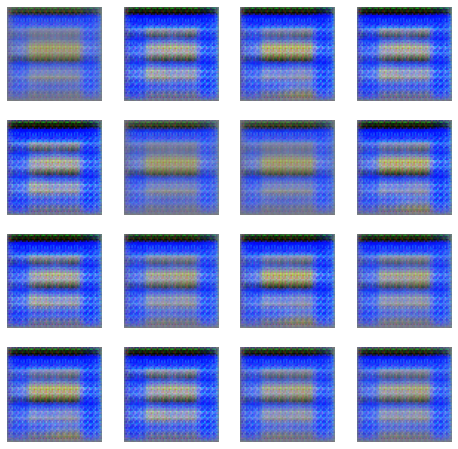

Epoch 26/30000
41/41 [==============================] - 7s 167ms/step - d_loss: 0.3168 - g_loss: 9.6130


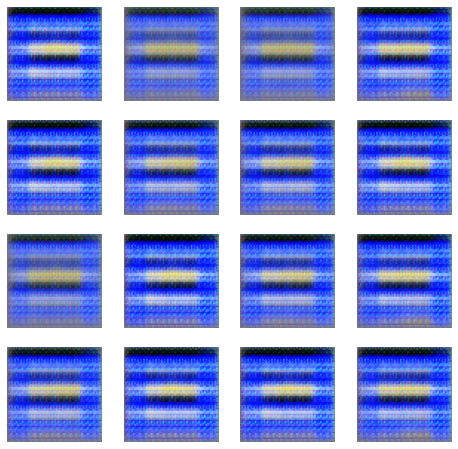

Epoch 27/30000
41/41 [==============================] - 6s 156ms/step - d_loss: 0.4038 - g_loss: 7.6619


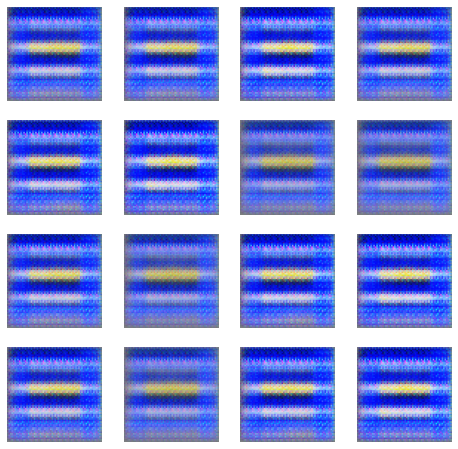

Epoch 28/30000
41/41 [==============================] - 6s 150ms/step - d_loss: 0.5161 - g_loss: 7.5929


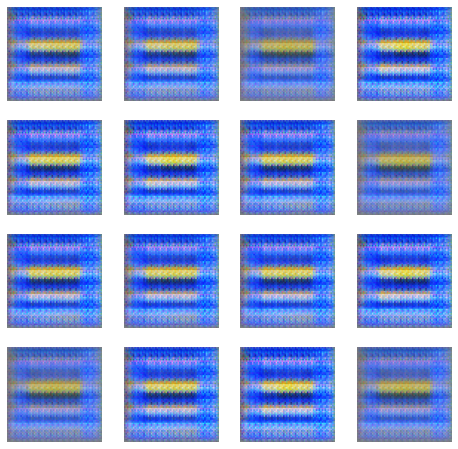

Epoch 29/30000
41/41 [==============================] - 6s 150ms/step - d_loss: 0.7178 - g_loss: 6.0339


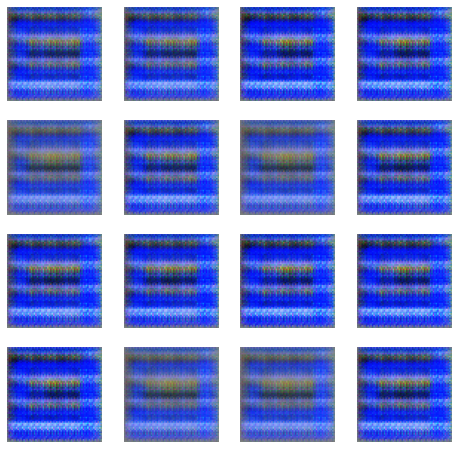

Epoch 30/30000
41/41 [==============================] - 6s 152ms/step - d_loss: 0.5908 - g_loss: 5.4669


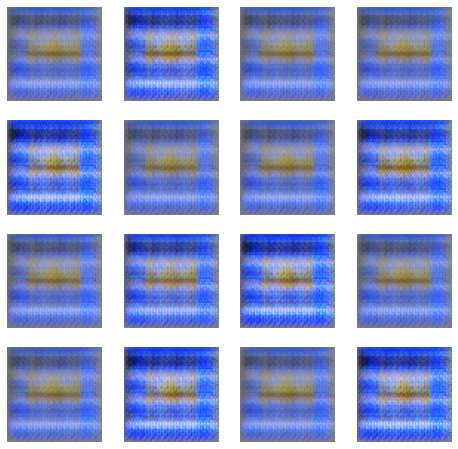

Epoch 31/30000
41/41 [==============================] - 6s 153ms/step - d_loss: 0.9134 - g_loss: 3.7734


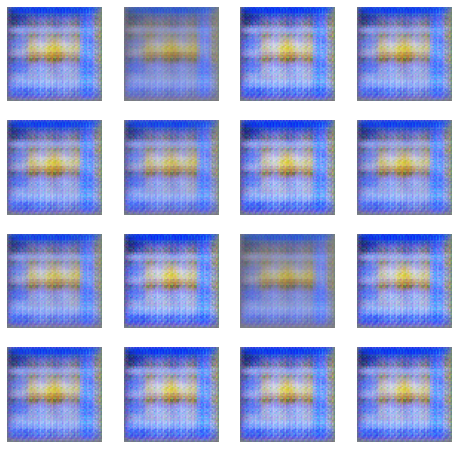

Epoch 32/30000
41/41 [==============================] - 7s 157ms/step - d_loss: 0.7364 - g_loss: 7.1179


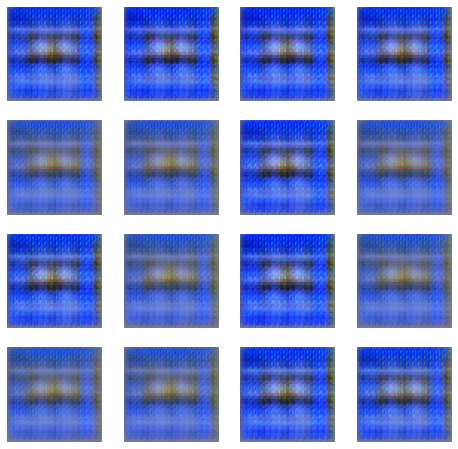

Epoch 33/30000
41/41 [==============================] - 6s 155ms/step - d_loss: 0.6693 - g_loss: 4.1151


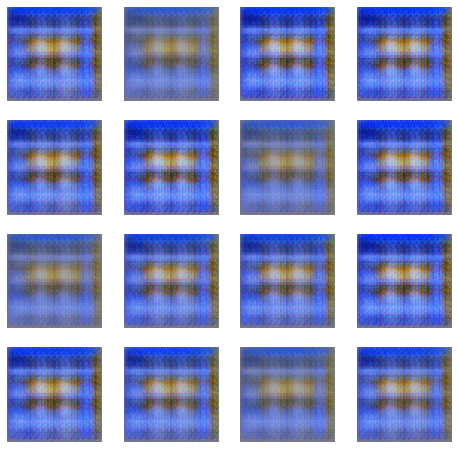

Epoch 34/30000
41/41 [==============================] - 6s 154ms/step - d_loss: 0.5463 - g_loss: 4.8613


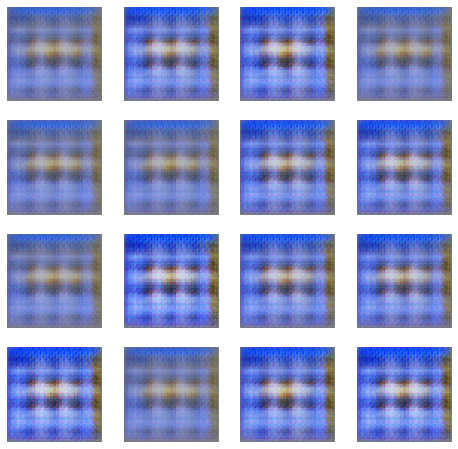

Epoch 35/30000
41/41 [==============================] - 7s 164ms/step - d_loss: 0.3733 - g_loss: 3.4294


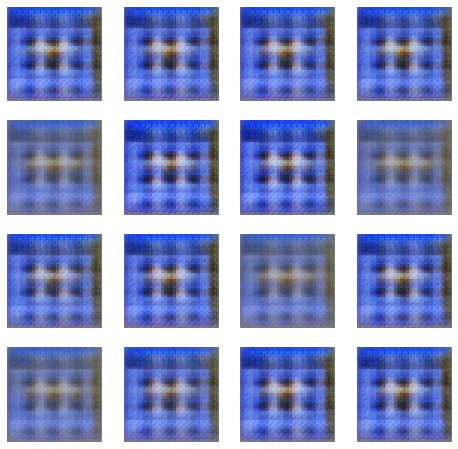

Epoch 36/30000
41/41 [==============================] - 7s 158ms/step - d_loss: 0.3306 - g_loss: 3.3760


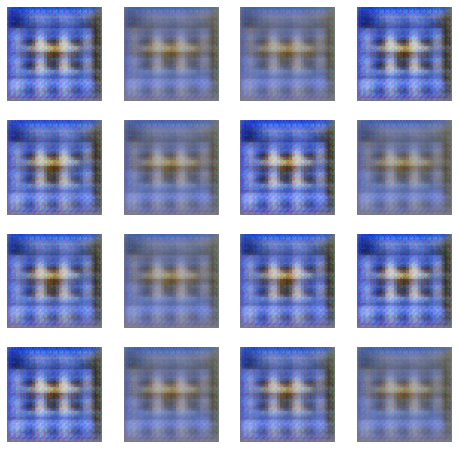

Epoch 37/30000
41/41 [==============================] - 6s 153ms/step - d_loss: 0.4686 - g_loss: 2.6165


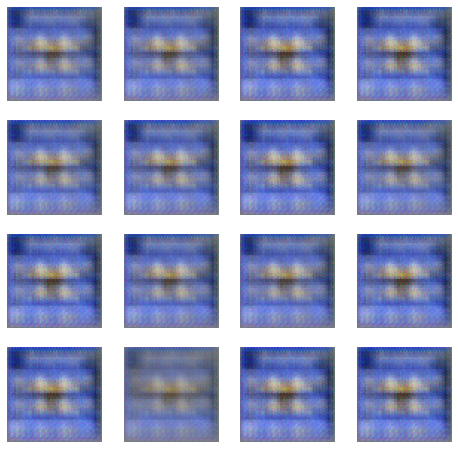

Epoch 38/30000
41/41 [==============================] - 6s 153ms/step - d_loss: 0.5870 - g_loss: 2.0289


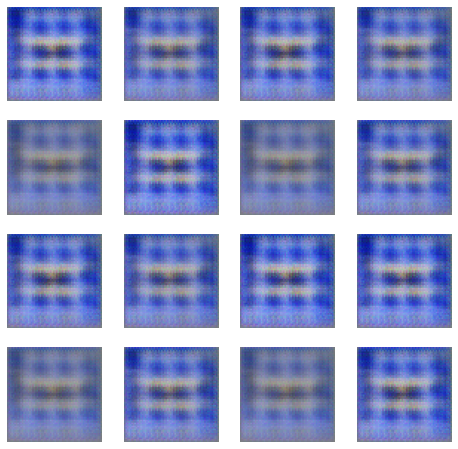

Epoch 39/30000
41/41 [==============================] - 6s 153ms/step - d_loss: 0.4313 - g_loss: 2.6224


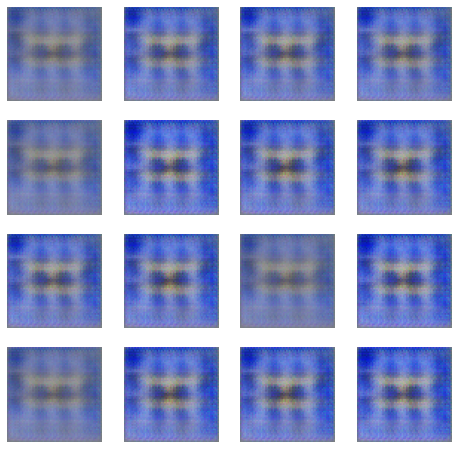

Epoch 40/30000
41/41 [==============================] - 6s 145ms/step - d_loss: 0.5406 - g_loss: 3.2931


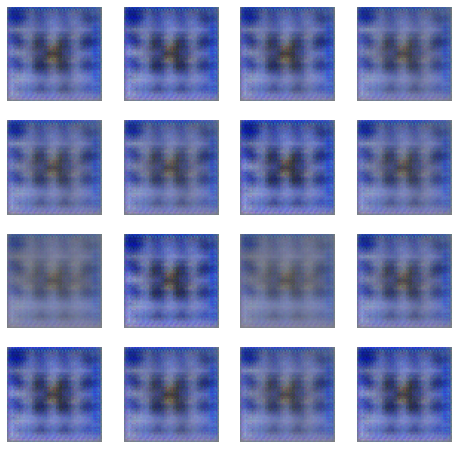

Epoch 41/30000
41/41 [==============================] - 6s 151ms/step - d_loss: 0.5421 - g_loss: 2.7056


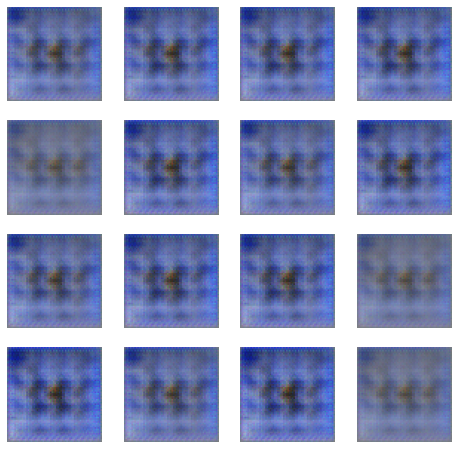

Epoch 42/30000
41/41 [==============================] - 6s 152ms/step - d_loss: 0.5978 - g_loss: 2.3760


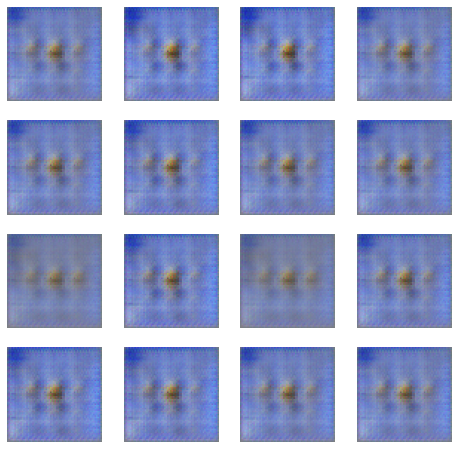

Epoch 43/30000
41/41 [==============================] - 7s 157ms/step - d_loss: 0.7171 - g_loss: 1.8903


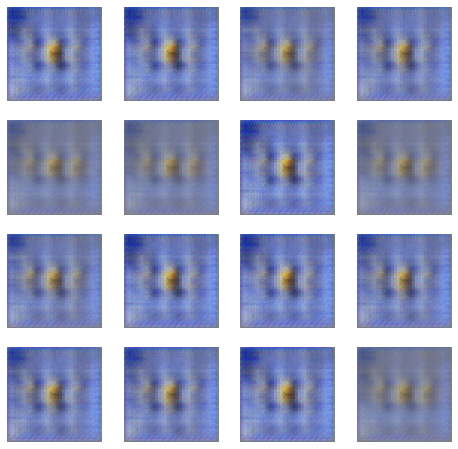

Epoch 44/30000
41/41 [==============================] - 6s 149ms/step - d_loss: 0.5486 - g_loss: 2.2383


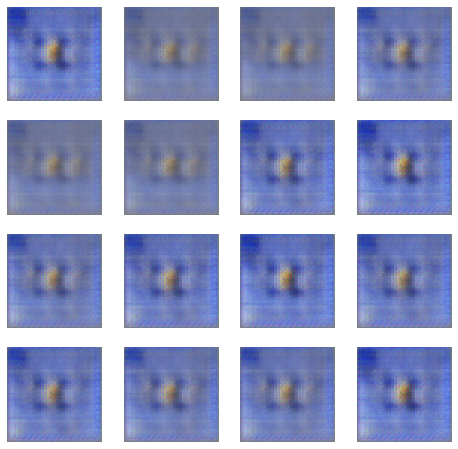

Epoch 45/30000
41/41 [==============================] - 7s 157ms/step - d_loss: 0.4365 - g_loss: 2.1474


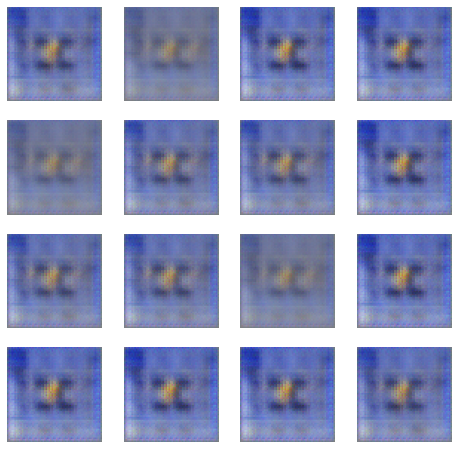

Epoch 46/30000
41/41 [==============================] - 6s 153ms/step - d_loss: 0.4852 - g_loss: 2.5340


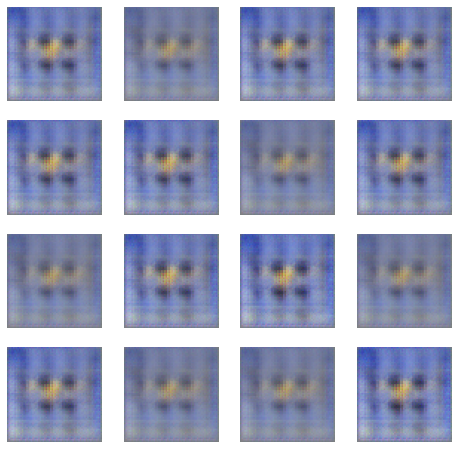

Epoch 47/30000
41/41 [==============================] - 6s 154ms/step - d_loss: 0.4287 - g_loss: 2.4764


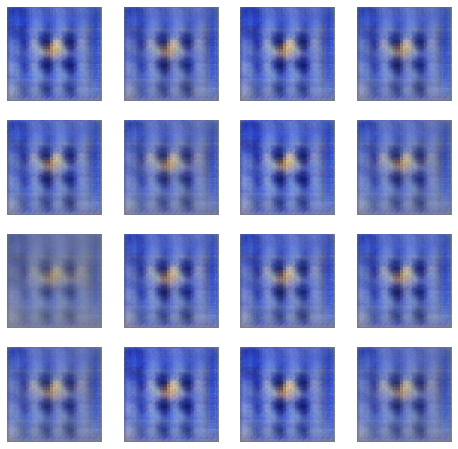

Epoch 48/30000
41/41 [==============================] - 6s 149ms/step - d_loss: 0.2663 - g_loss: 2.9174


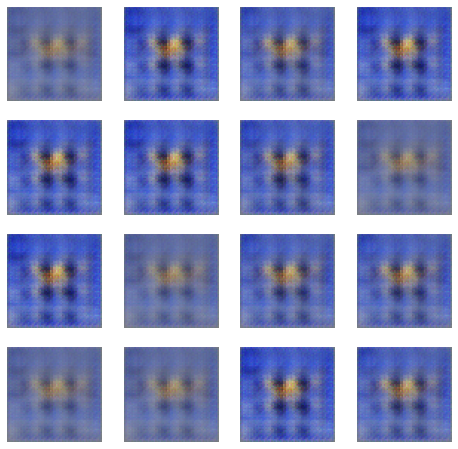

Epoch 49/30000
41/41 [==============================] - 6s 146ms/step - d_loss: 0.2269 - g_loss: 3.8904


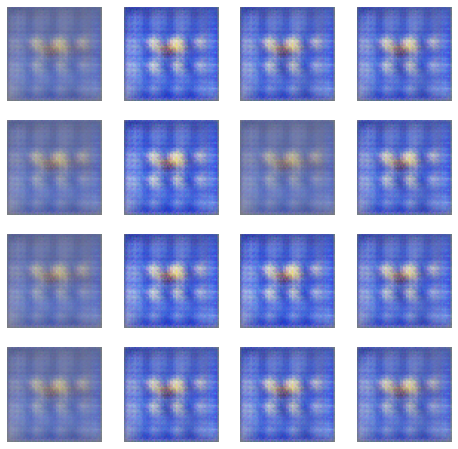

Epoch 50/30000
41/41 [==============================] - 6s 146ms/step - d_loss: 0.3413 - g_loss: 3.8665


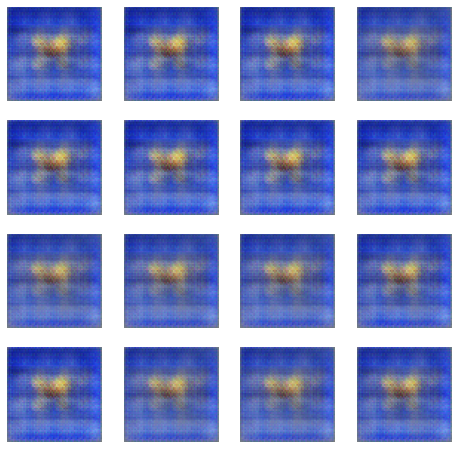

Epoch 51/30000
41/41 [==============================] - 6s 150ms/step - d_loss: 0.3744 - g_loss: 3.7108


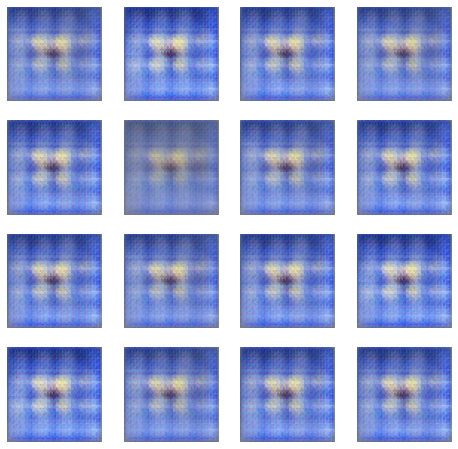

Epoch 52/30000
41/41 [==============================] - 6s 144ms/step - d_loss: 0.3737 - g_loss: 2.8728


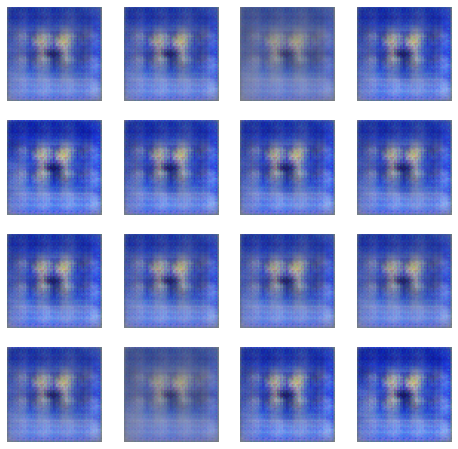

Epoch 53/30000
41/41 [==============================] - 7s 161ms/step - d_loss: 0.2347 - g_loss: 3.1184


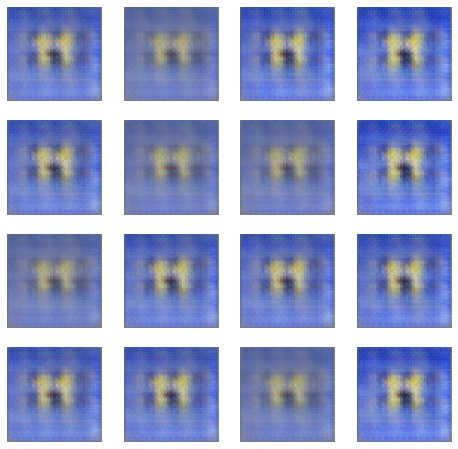

Epoch 54/30000
41/41 [==============================] - 7s 163ms/step - d_loss: 0.2652 - g_loss: 2.5059


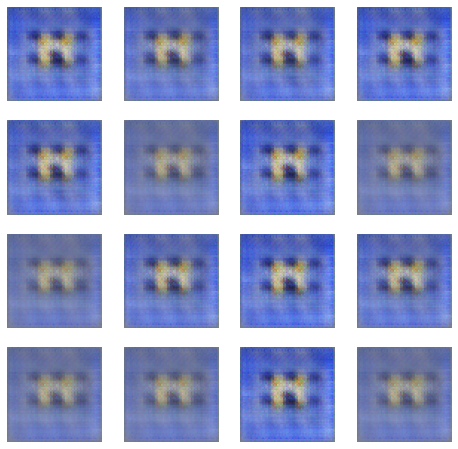

Epoch 55/30000
41/41 [==============================] - 8s 193ms/step - d_loss: 0.3448 - g_loss: 2.2223


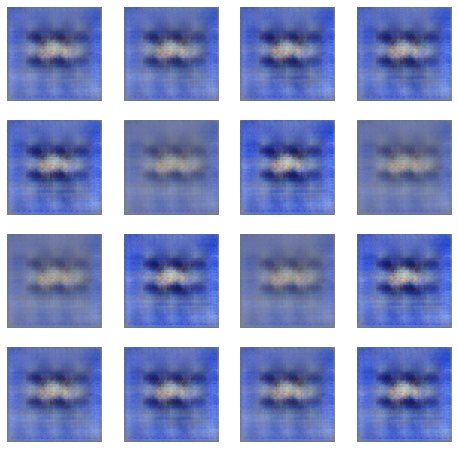

Epoch 56/30000
41/41 [==============================] - 7s 158ms/step - d_loss: 0.5198 - g_loss: 3.9158


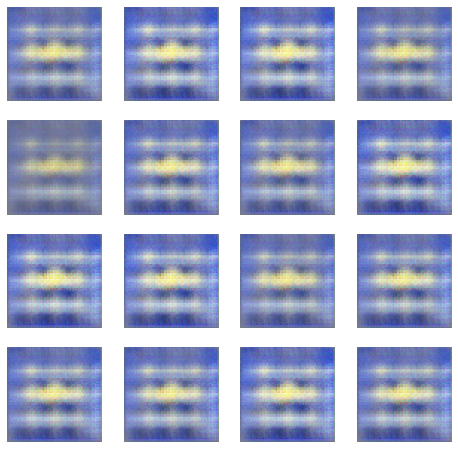

Epoch 57/30000
41/41 [==============================] - 7s 159ms/step - d_loss: 0.5112 - g_loss: 4.1424


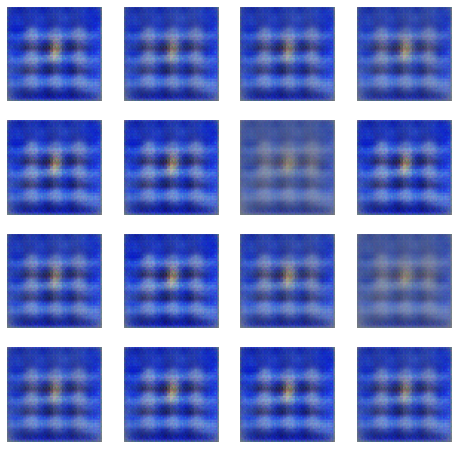

Epoch 58/30000
41/41 [==============================] - 8s 192ms/step - d_loss: 0.3968 - g_loss: 3.9233


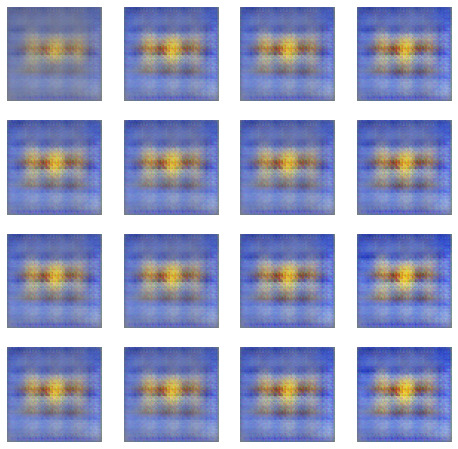

Epoch 59/30000
41/41 [==============================] - 7s 170ms/step - d_loss: 0.5458 - g_loss: 2.7450


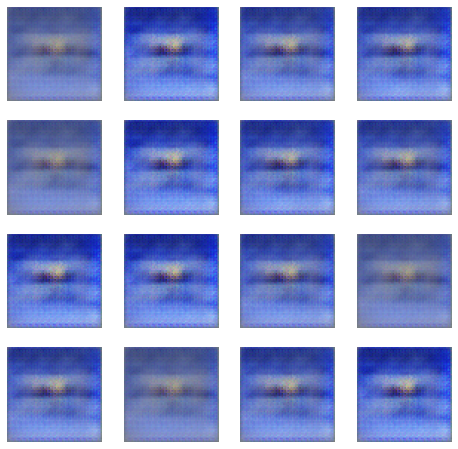

Epoch 60/30000
41/41 [==============================] - 12s 283ms/step - d_loss: 0.2375 - g_loss: 3.3279


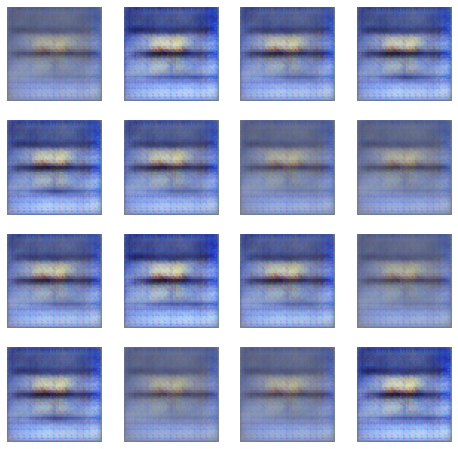

Epoch 61/30000
20/41 [=============>................] - ETA: 11s - d_loss: 0.1626 - g_loss: 3.3143

KeyboardInterrupt: 

In [11]:
logdir = 'gan-logdir/horses_cows/'
isaveimg = SaveImagesCallback(logdir= logdir)

with tf.device('/device:GPU:0'):
    gan = GAN(discriminator=discriminator, generator=generator, latent_dim=latent_dim, batch_size= batch_size)
    
    lr_schedule = keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-4,
    decay_steps=10000,
    decay_rate=0.9)
    
    optimizer_d = keras.optimizers.Adam(learning_rate=lr_schedule)
    optimizer_g = keras.optimizers.Adam(learning_rate= lr_schedule)
    gan.compile(
        #d_optimizer=keras.optimizers.Adam(learning_rate=0.0001),
        #g_optimizer=keras.optimizers.Adam(learning_rate=0.0001),
        d_optimizer= optimizer_d,
        g_optimizer= optimizer_g,
        loss_fn=keras.losses.BinaryCrossentropy(),
    )

    # To limit the execution time, we only train on 100 batches. You can train on
    # the entire dataset. You will need about 20 epochs to get nice results.
    gan.fit(train_cat_dog_data, epochs=30000, callbacks= [isaveimg], workers= 10)

In [18]:
1e-4

0.0001